# DDoS Cybersecurity Data

# Feature Selection

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy as sp
import itertools
import time
import statsmodels.api as sm
import warnings
warnings.filterwarnings("ignore")

In [2]:
pip install mlxtend

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [3]:
from sklearn.neighbors import KNeighborsClassifier as knn
from sklearn.linear_model import LogisticRegression as LGR
from sklearn.ensemble import RandomForestClassifier as rfc

In [4]:
df = pd.read_csv('D:\\IIT Kharagpur Notes\\Semester IV\\Datasets\\MachineLearningCSV\\MachineLearningCVE\\Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv')

In [5]:
df['attack_label'] = 0

In [6]:
for i in range(len(df)):
    if df[' Label'][i] != 'BENIGN':
        df['attack_label'][i] = 1

In [7]:
df.head()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label,attack_label
0,54865,3,2,0,12,0,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
1,55054,109,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
2,55055,52,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
3,46236,34,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
4,54863,3,2,0,12,0,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0


In [8]:
df.tail()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label,attack_label
225740,61374,61,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
225741,61378,72,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
225742,61375,75,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
225743,61323,48,2,0,12,0,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
225744,61326,68,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0


In [9]:
df

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label,attack_label
0,54865,3,2,0,12,0,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
1,55054,109,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
2,55055,52,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
3,46236,34,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
4,54863,3,2,0,12,0,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225740,61374,61,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
225741,61378,72,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
225742,61375,75,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
225743,61323,48,2,0,12,0,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225745 entries, 0 to 225744
Data columns (total 80 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0    Destination Port             225745 non-null  int64  
 1    Flow Duration                225745 non-null  int64  
 2    Total Fwd Packets            225745 non-null  int64  
 3    Total Backward Packets       225745 non-null  int64  
 4   Total Length of Fwd Packets   225745 non-null  int64  
 5    Total Length of Bwd Packets  225745 non-null  int64  
 6    Fwd Packet Length Max        225745 non-null  int64  
 7    Fwd Packet Length Min        225745 non-null  int64  
 8    Fwd Packet Length Mean       225745 non-null  float64
 9    Fwd Packet Length Std        225745 non-null  float64
 10  Bwd Packet Length Max         225745 non-null  int64  
 11   Bwd Packet Length Min        225745 non-null  int64  
 12   Bwd Packet Length Mean       225745 non-nul

In [11]:
df.describe()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,attack_label
count,225745.00000,2.257450e+05,225745.000000,225745.000000,225745.000000,2.257450e+05,225745.000000,225745.000000,225745.000000,225745.000000,...,225745.000000,2.257450e+05,2.257450e+05,2.257450e+05,2.257450e+05,2.257450e+05,2.257450e+05,2.257450e+05,2.257450e+05,225745.000000
mean,8879.61946,1.624165e+07,4.874916,4.572775,939.463346,5.960477e+03,538.535693,27.882221,164.826715,214.907242,...,21.482753,1.848261e+05,1.293436e+04,2.080849e+05,1.776201e+05,1.032214e+07,3.611943e+06,1.287813e+07,7.755355e+06,0.567131
std,19754.64740,3.152437e+07,15.422874,21.755356,3249.403484,3.921834e+04,1864.128991,163.324159,504.892965,797.411073,...,4.166799,7.979250e+05,2.102737e+05,9.002350e+05,7.842602e+05,2.185303e+07,1.275689e+07,2.692126e+07,1.983109e+07,0.495474
min,0.00000,-1.000000e+00,1.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
25%,80.00000,7.118000e+04,2.000000,1.000000,26.000000,0.000000e+00,6.000000,0.000000,6.000000,0.000000,...,20.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
50%,80.00000,1.452333e+06,3.000000,4.000000,30.000000,1.640000e+02,20.000000,0.000000,8.666667,5.301991,...,20.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000
75%,80.00000,8.805237e+06,5.000000,5.000000,63.000000,1.160100e+04,34.000000,6.000000,32.000000,10.263203,...,20.000000,1.878000e+03,0.000000e+00,1.878000e+03,1.862000e+03,8.239725e+06,0.000000e+00,8.253838e+06,7.422849e+06,1.000000
max,65532.00000,1.199999e+08,1932.000000,2942.000000,183012.000000,5.172346e+06,11680.000000,1472.000000,3867.000000,6692.644993,...,52.000000,1.000000e+08,3.950000e+07,1.000000e+08,1.000000e+08,1.200000e+08,6.530000e+07,1.200000e+08,1.200000e+08,1.000000


In [12]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Destination Port,225745.0,8.879619e+03,1.975465e+04,0.0,80.0,80.0,80.0,65532.0
Flow Duration,225745.0,1.624165e+07,3.152437e+07,-1.0,71180.0,1452333.0,8805237.0,119999937.0
Total Fwd Packets,225745.0,4.874916e+00,1.542287e+01,1.0,2.0,3.0,5.0,1932.0
Total Backward Packets,225745.0,4.572775e+00,2.175536e+01,0.0,1.0,4.0,5.0,2942.0
Total Length of Fwd Packets,225745.0,9.394633e+02,3.249403e+03,0.0,26.0,30.0,63.0,183012.0
...,...,...,...,...,...,...,...,...
Idle Mean,225745.0,1.032214e+07,2.185303e+07,0.0,0.0,0.0,8239725.0,120000000.0
Idle Std,225745.0,3.611943e+06,1.275689e+07,0.0,0.0,0.0,0.0,65300000.0
Idle Max,225745.0,1.287813e+07,2.692126e+07,0.0,0.0,0.0,8253838.0,120000000.0
Idle Min,225745.0,7.755355e+06,1.983109e+07,0.0,0.0,0.0,7422849.0,120000000.0


In [13]:
df.corr()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,attack_label
Destination Port,1.000000,0.107038,-0.044270,0.008321,0.553843,-0.066648,0.604586,0.207158,0.658346,0.586255,...,-0.074278,0.061313,-0.026592,0.043156,0.066356,0.132272,0.110687,0.144428,0.095687,-0.509798
Flow Duration,0.107038,1.000000,0.207660,0.145272,0.297832,0.088751,0.280808,-0.055700,0.257098,0.273820,...,-0.112832,0.428397,0.148295,0.446759,0.413835,0.871855,0.630604,0.919199,0.672003,0.025923
Total Fwd Packets,-0.044270,0.207660,1.000000,0.956714,0.174396,0.938470,0.041866,-0.038103,0.017458,0.030054,...,-0.005388,0.135892,0.285131,0.223377,0.087692,0.110787,0.056807,0.109429,0.094747,-0.029870
Total Backward Packets,0.008321,0.145272,0.956714,1.000000,0.163495,0.970422,0.047501,-0.001468,0.032013,0.034200,...,0.009922,0.099090,0.228430,0.164830,0.063551,0.065554,0.028627,0.062932,0.058056,-0.069290
Total Length of Fwd Packets,0.553843,0.297832,0.174396,0.163495,1.000000,0.067425,0.852427,0.004453,0.858439,0.839139,...,-0.048262,0.185853,0.106051,0.203046,0.171280,0.261110,0.216771,0.284694,0.188569,-0.319693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Idle Mean,0.132272,0.871855,0.110787,0.065554,0.261110,0.042256,0.272060,-0.039715,0.262143,0.270210,...,-0.139772,0.595859,0.022025,0.531538,0.602021,1.000000,0.420170,0.952585,0.910822,0.087114
Idle Std,0.110687,0.630604,0.056807,0.028627,0.216771,0.020081,0.230387,-0.048230,0.223047,0.232630,...,-0.099363,-0.057820,-0.003866,-0.055222,-0.058847,0.420170,1.000000,0.676276,0.008218,0.078023
Idle Max,0.144428,0.919199,0.109429,0.062932,0.284694,0.041055,0.298035,-0.048410,0.287524,0.297282,...,-0.146873,0.464725,0.017842,0.413812,0.469089,0.952585,0.676276,1.000000,0.742109,0.096775
Idle Min,0.095687,0.672003,0.094747,0.058056,0.188569,0.036789,0.194918,-0.021718,0.187498,0.191951,...,-0.109090,0.682722,0.024496,0.609839,0.690201,0.910822,0.008218,0.742109,1.000000,0.061243


In [14]:
df.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
225740    False
225741    False
225742    False
225743    False
225744    False
Length: 225745, dtype: bool

In [15]:
df.drop_duplicates()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label,attack_label
0,54865,3,2,0,12,0,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
1,55054,109,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
2,55055,52,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
3,46236,34,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
4,54863,3,2,0,12,0,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225740,61374,61,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
225741,61378,72,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
225742,61375,75,1,1,6,6,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0
225743,61323,48,2,0,12,0,6,6,6.0,0.0,...,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN,0


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225745 entries, 0 to 225744
Data columns (total 80 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0    Destination Port             225745 non-null  int64  
 1    Flow Duration                225745 non-null  int64  
 2    Total Fwd Packets            225745 non-null  int64  
 3    Total Backward Packets       225745 non-null  int64  
 4   Total Length of Fwd Packets   225745 non-null  int64  
 5    Total Length of Bwd Packets  225745 non-null  int64  
 6    Fwd Packet Length Max        225745 non-null  int64  
 7    Fwd Packet Length Min        225745 non-null  int64  
 8    Fwd Packet Length Mean       225745 non-null  float64
 9    Fwd Packet Length Std        225745 non-null  float64
 10  Bwd Packet Length Max         225745 non-null  int64  
 11   Bwd Packet Length Min        225745 non-null  int64  
 12   Bwd Packet Length Mean       225745 non-nul

In [17]:
df.columns

Index([' Destination Port', ' Flow Duration', ' Total Fwd Packets',
       ' Total Backward Packets', 'Total Length of Fwd Packets',
       ' Total Length of Bwd Packets', ' Fwd Packet Length Max',
       ' Fwd Packet Length Min', ' Fwd Packet Length Mean',
       ' Fwd Packet Length Std', 'Bwd Packet Length Max',
       ' Bwd Packet Length Min', ' Bwd Packet Length Mean',
       ' Bwd Packet Length Std', 'Flow Bytes/s', ' Flow Packets/s',
       ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max', ' Flow IAT Min',
       'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std', ' Fwd IAT Max',
       ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean', ' Bwd IAT Std',
       ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags', ' Bwd PSH Flags',
       ' Fwd URG Flags', ' Bwd URG Flags', ' Fwd Header Length',
       ' Bwd Header Length', 'Fwd Packets/s', ' Bwd Packets/s',
       ' Min Packet Length', ' Max Packet Length', ' Packet Length Mean',
       ' Packet Length Std', ' Packet Length Variance', '

In [18]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Destination Port,225745.0,8.879619e+03,1.975465e+04,0.0,80.0,80.0,80.0,65532.0
Flow Duration,225745.0,1.624165e+07,3.152437e+07,-1.0,71180.0,1452333.0,8805237.0,119999937.0
Total Fwd Packets,225745.0,4.874916e+00,1.542287e+01,1.0,2.0,3.0,5.0,1932.0
Total Backward Packets,225745.0,4.572775e+00,2.175536e+01,0.0,1.0,4.0,5.0,2942.0
Total Length of Fwd Packets,225745.0,9.394633e+02,3.249403e+03,0.0,26.0,30.0,63.0,183012.0
...,...,...,...,...,...,...,...,...
Idle Mean,225745.0,1.032214e+07,2.185303e+07,0.0,0.0,0.0,8239725.0,120000000.0
Idle Std,225745.0,3.611943e+06,1.275689e+07,0.0,0.0,0.0,0.0,65300000.0
Idle Max,225745.0,1.287813e+07,2.692126e+07,0.0,0.0,0.0,8253838.0,120000000.0
Idle Min,225745.0,7.755355e+06,1.983109e+07,0.0,0.0,0.0,7422849.0,120000000.0


In [19]:
df.corr()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,attack_label
Destination Port,1.000000,0.107038,-0.044270,0.008321,0.553843,-0.066648,0.604586,0.207158,0.658346,0.586255,...,-0.074278,0.061313,-0.026592,0.043156,0.066356,0.132272,0.110687,0.144428,0.095687,-0.509798
Flow Duration,0.107038,1.000000,0.207660,0.145272,0.297832,0.088751,0.280808,-0.055700,0.257098,0.273820,...,-0.112832,0.428397,0.148295,0.446759,0.413835,0.871855,0.630604,0.919199,0.672003,0.025923
Total Fwd Packets,-0.044270,0.207660,1.000000,0.956714,0.174396,0.938470,0.041866,-0.038103,0.017458,0.030054,...,-0.005388,0.135892,0.285131,0.223377,0.087692,0.110787,0.056807,0.109429,0.094747,-0.029870
Total Backward Packets,0.008321,0.145272,0.956714,1.000000,0.163495,0.970422,0.047501,-0.001468,0.032013,0.034200,...,0.009922,0.099090,0.228430,0.164830,0.063551,0.065554,0.028627,0.062932,0.058056,-0.069290
Total Length of Fwd Packets,0.553843,0.297832,0.174396,0.163495,1.000000,0.067425,0.852427,0.004453,0.858439,0.839139,...,-0.048262,0.185853,0.106051,0.203046,0.171280,0.261110,0.216771,0.284694,0.188569,-0.319693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Idle Mean,0.132272,0.871855,0.110787,0.065554,0.261110,0.042256,0.272060,-0.039715,0.262143,0.270210,...,-0.139772,0.595859,0.022025,0.531538,0.602021,1.000000,0.420170,0.952585,0.910822,0.087114
Idle Std,0.110687,0.630604,0.056807,0.028627,0.216771,0.020081,0.230387,-0.048230,0.223047,0.232630,...,-0.099363,-0.057820,-0.003866,-0.055222,-0.058847,0.420170,1.000000,0.676276,0.008218,0.078023
Idle Max,0.144428,0.919199,0.109429,0.062932,0.284694,0.041055,0.298035,-0.048410,0.287524,0.297282,...,-0.146873,0.464725,0.017842,0.413812,0.469089,0.952585,0.676276,1.000000,0.742109,0.096775
Idle Min,0.095687,0.672003,0.094747,0.058056,0.188569,0.036789,0.194918,-0.021718,0.187498,0.191951,...,-0.109090,0.682722,0.024496,0.609839,0.690201,0.910822,0.008218,0.742109,1.000000,0.061243


In [20]:
df.corr().transpose()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,attack_label
Destination Port,1.000000,0.107038,-0.044270,0.008321,0.553843,-0.066648,0.604586,0.207158,0.658346,0.586255,...,-0.074278,0.061313,-0.026592,0.043156,0.066356,0.132272,0.110687,0.144428,0.095687,-0.509798
Flow Duration,0.107038,1.000000,0.207660,0.145272,0.297832,0.088751,0.280808,-0.055700,0.257098,0.273820,...,-0.112832,0.428397,0.148295,0.446759,0.413835,0.871855,0.630604,0.919199,0.672003,0.025923
Total Fwd Packets,-0.044270,0.207660,1.000000,0.956714,0.174396,0.938470,0.041866,-0.038103,0.017458,0.030054,...,-0.005388,0.135892,0.285131,0.223377,0.087692,0.110787,0.056807,0.109429,0.094747,-0.029870
Total Backward Packets,0.008321,0.145272,0.956714,1.000000,0.163495,0.970422,0.047501,-0.001468,0.032013,0.034200,...,0.009922,0.099090,0.228430,0.164830,0.063551,0.065554,0.028627,0.062932,0.058056,-0.069290
Total Length of Fwd Packets,0.553843,0.297832,0.174396,0.163495,1.000000,0.067425,0.852427,0.004453,0.858439,0.839139,...,-0.048262,0.185853,0.106051,0.203046,0.171280,0.261110,0.216771,0.284694,0.188569,-0.319693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Idle Mean,0.132272,0.871855,0.110787,0.065554,0.261110,0.042256,0.272060,-0.039715,0.262143,0.270210,...,-0.139772,0.595859,0.022025,0.531538,0.602021,1.000000,0.420170,0.952585,0.910822,0.087114
Idle Std,0.110687,0.630604,0.056807,0.028627,0.216771,0.020081,0.230387,-0.048230,0.223047,0.232630,...,-0.099363,-0.057820,-0.003866,-0.055222,-0.058847,0.420170,1.000000,0.676276,0.008218,0.078023
Idle Max,0.144428,0.919199,0.109429,0.062932,0.284694,0.041055,0.298035,-0.048410,0.287524,0.297282,...,-0.146873,0.464725,0.017842,0.413812,0.469089,0.952585,0.676276,1.000000,0.742109,0.096775
Idle Min,0.095687,0.672003,0.094747,0.058056,0.188569,0.036789,0.194918,-0.021718,0.187498,0.191951,...,-0.109090,0.682722,0.024496,0.609839,0.690201,0.910822,0.008218,0.742109,1.000000,0.061243


In [21]:
df['attack_label'].value_counts()

1    128027
0     97718
Name: attack_label, dtype: int64

In [22]:
plt.figure(figsize = (100,100))
ax=sns.heatmap(df.corr(),linewidth=0.5,annot=True,annot_kws={'size': 15})

In [23]:
plt.figure(figsize = (100,100))
ax=sns.heatmap(df.corr(),linewidth=0.5,cmap='viridis',annot=True,annot_kws={'size': 15})

In [24]:
X = df.drop([' Destination Port',' Flow Packets/s', 'Flow Bytes/s',' Total Fwd Packets',' Total Length of Bwd Packets',' Fwd Packet Length Max','Bwd Packet Length Max',' Flow IAT Std',' Flow IAT Min','Fwd IAT Total',' Fwd IAT Max',' Bwd IAT Max',' Fwd Header Length',' Bwd Header Length',' Fwd Header Length.1','Fwd Packets/s',' SYN Flag Count',' Packet Length Std',' ECE Flag Count',' Average Packet Size',' Avg Fwd Segment Size', ' Avg Bwd Segment Size','Subflow Fwd Packets', ' Subflow Fwd Bytes',
       ' Subflow Bwd Packets', ' Subflow Bwd Bytes',' Label', 'attack_label'],axis=1)
y = df['attack_label']

In [25]:
X

,Flow Duration,Total Backward Packets,Total Length of Fwd Packets,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow IAT Mean,...,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
0,3,0,12,6,6.0,0.0,0,0.0,0.0,3.0,...,1,20,0.0,0.0,0,0,0.0,0.0,0,0
1,109,1,6,6,6.0,0.0,6,6.0,0.0,109.0,...,0,20,0.0,0.0,0,0,0.0,0.0,0,0
2,52,1,6,6,6.0,0.0,6,6.0,0.0,52.0,...,0,20,0.0,0.0,0,0,0.0,0.0,0,0
3,34,1,6,6,6.0,0.0,6,6.0,0.0,34.0,...,0,20,0.0,0.0,0,0,0.0,0.0,0,0
4,3,0,12,6,6.0,0.0,0,0.0,0.0,3.0,...,1,20,0.0,0.0,0,0,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225740,61,1,6,6,6.0,0.0,6,6.0,0.0,61.0,...,0,20,0.0,0.0,0,0,0.0,0.0,0,0
225741,72,1,6,6,6.0,0.0,6,6.0,0.0,72.0,...,0,20,0.0,0.0,0,0,0.0,0.0,0,0
225742,75,1,6,6,6.0,0.0,6,6.0,0.0,75.0,...,0,20,0.0,0.0,0,0,0.0,0.0,0,0
225743,48,0,12,6,6.0,0.0,0,0.0,0.0,48.0,...,1,20,0.0,0.0,0,0,0.0,0.0,0,0


In [26]:
y

0         0
1         0
2         0
3         0
4         0
         ..
225740    0
225741    0
225742    0
225743    0
225744    0
Name: attack_label, Length: 225745, dtype: int64

In [27]:
X.shape, y.shape

((225745, 52), (225745,))

## Forward Feature Selection

In [28]:
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

In [29]:
feature_names=tuple(X.columns)
feature_names

(' Flow Duration',
 ' Total Backward Packets',
 'Total Length of Fwd Packets',
 ' Fwd Packet Length Min',
 ' Fwd Packet Length Mean',
 ' Fwd Packet Length Std',
 ' Bwd Packet Length Min',
 ' Bwd Packet Length Mean',
 ' Bwd Packet Length Std',
 ' Flow IAT Mean',
 ' Flow IAT Max',
 ' Fwd IAT Mean',
 ' Fwd IAT Std',
 ' Fwd IAT Min',
 'Bwd IAT Total',
 ' Bwd IAT Mean',
 ' Bwd IAT Std',
 ' Bwd IAT Min',
 'Fwd PSH Flags',
 ' Bwd PSH Flags',
 ' Fwd URG Flags',
 ' Bwd URG Flags',
 ' Bwd Packets/s',
 ' Min Packet Length',
 ' Max Packet Length',
 ' Packet Length Mean',
 ' Packet Length Variance',
 'FIN Flag Count',
 ' RST Flag Count',
 ' PSH Flag Count',
 ' ACK Flag Count',
 ' URG Flag Count',
 ' CWE Flag Count',
 ' Down/Up Ratio',
 'Fwd Avg Bytes/Bulk',
 ' Fwd Avg Packets/Bulk',
 ' Fwd Avg Bulk Rate',
 ' Bwd Avg Bytes/Bulk',
 ' Bwd Avg Packets/Bulk',
 'Bwd Avg Bulk Rate',
 'Init_Win_bytes_forward',
 ' Init_Win_bytes_backward',
 ' act_data_pkt_fwd',
 ' min_seg_size_forward',
 'Active Mean',
 ' A

In [30]:
sfs1 = SFS(LGR(max_iter=100),
           k_features='best', 
           forward=True, 
           floating=False, 
           verbose=2,
           scoring='accuracy',
           cv=0)

sfs1 = sfs1.fit(X, y,feature_names)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    9.7s finished

[2023-02-16 04:45:38] Features: 1/52 -- score: 0.8650867128840063[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  51 out of  51 | elapsed:   18.4s finished

[2023-02-16 04:45:57] Features: 2/52 -- score: 0.9506921526501141[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   26.7s finished

[2023-02-16 04:46:24] Features: 3/52 -- score: 0.9670601785200115[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  

[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:   44.1s finished

[2023-02-16 05:09:20] Features: 28/52 -- score: 0.9983344038627655[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:   41.4s finished

[2023-02-16 05:10:01] Features: 29/52 -- score: 0.9983211145318833[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  23 out of  23 | elapsed:   40.7s finished

[2023-02-16 05:10:42] Features: 30/52 -- score: 0.9984407185098231[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.7s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  22 out of  22 | elapsed:   45.1s finished

[2023-02-16 05:11:27] Features: 31/

In [31]:
sfs1.subsets_

{1: {'feature_idx': (4,),
  'cv_scores': array([0.86508671]),
  'avg_score': 0.8650867128840063,
  'feature_names': (' Fwd Packet Length Mean',)},
 2: {'feature_idx': (4, 31),
  'cv_scores': array([0.95069215]),
  'avg_score': 0.9506921526501141,
  'feature_names': (' Fwd Packet Length Mean', ' URG Flag Count')},
 3: {'feature_idx': (4, 31, 43),
  'cv_scores': array([0.96706018]),
  'avg_score': 0.9670601785200115,
  'feature_names': (' Fwd Packet Length Mean',
   ' URG Flag Count',
   ' min_seg_size_forward')},
 4: {'feature_idx': (4, 8, 31, 43),
  'cv_scores': array([0.97089637]),
  'avg_score': 0.9708963653680037,
  'feature_names': (' Fwd Packet Length Mean',
   ' Bwd Packet Length Std',
   ' URG Flag Count',
   ' min_seg_size_forward')},
 5: {'feature_idx': (4, 8, 31, 40, 43),
  'cv_scores': array([0.97992425]),
  'avg_score': 0.9799242508139715,
  'feature_names': (' Fwd Packet Length Mean',
   ' Bwd Packet Length Std',
   ' URG Flag Count',
   'Init_Win_bytes_forward',
   ' min_

In [32]:
sfs1.get_metric_dict()

{1: {'feature_idx': (4,),
  'cv_scores': array([0.86508671]),
  'avg_score': 0.8650867128840063,
  'feature_names': (' Fwd Packet Length Mean',),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 2: {'feature_idx': (4, 31),
  'cv_scores': array([0.95069215]),
  'avg_score': 0.9506921526501141,
  'feature_names': (' Fwd Packet Length Mean', ' URG Flag Count'),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 3: {'feature_idx': (4, 31, 43),
  'cv_scores': array([0.96706018]),
  'avg_score': 0.9670601785200115,
  'feature_names': (' Fwd Packet Length Mean',
   ' URG Flag Count',
   ' min_seg_size_forward'),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 4: {'feature_idx': (4, 8, 31, 43),
  'cv_scores': array([0.97089637]),
  'avg_score': 0.9708963653680037,
  'feature_names': (' Fwd Packet Length Mean',
   ' Bwd Packet Length Std',
   ' URG Flag Count',
   ' min_seg_size_forward'),
  'ci_bound': nan,
  'std_dev': 0.0,
  'std_err': nan},
 5: {'feature_idx': (4, 8, 

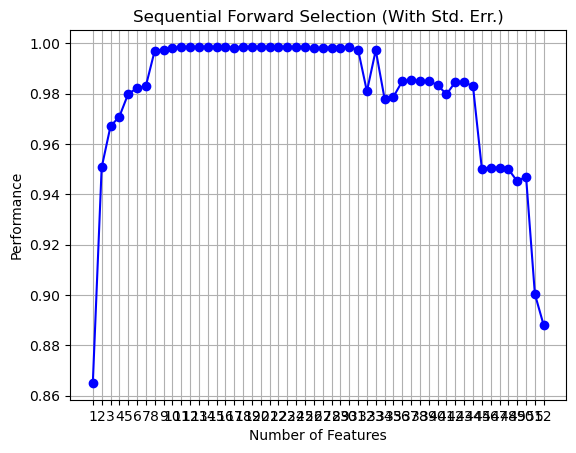

In [33]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

fig1 = plot_sfs(sfs1.get_metric_dict(confidence_interval=0.95), kind='std_err')

plt.title('Sequential Forward Selection (With Std. Err.)')
plt.grid()
plt.show()

In [34]:
sfs1.k_feature_names_, sfs1.k_feature_idx_

((' Total Backward Packets',
  'Total Length of Fwd Packets',
  ' Fwd Packet Length Mean',
  ' Bwd Packet Length Min',
  ' Bwd Packet Length Std',
  ' Packet Length Mean',
  'FIN Flag Count',
  ' RST Flag Count',
  ' URG Flag Count',
  ' Down/Up Ratio',
  'Init_Win_bytes_forward',
  ' act_data_pkt_fwd',
  ' min_seg_size_forward'),
 (1, 2, 4, 6, 8, 25, 27, 28, 31, 33, 40, 42, 43))

In [35]:
df = pd.DataFrame.from_dict(sfs1.get_metric_dict()).T
df[["feature_idx","avg_score"]]

,feature_idx,avg_score
1,"(4,)",0.865087
2,"(4, 31)",0.950692
3,"(4, 31, 43)",0.96706
4,"(4, 8, 31, 43)",0.970896
5,"(4, 8, 31, 40, 43)",0.979924
6,"(4, 8, 27, 31, 40, 43)",0.982179
7,"(1, 4, 8, 27, 31, 40, 43)",0.983069
8,"(1, 4, 8, 27, 31, 40, 42, 43)",0.997098
9,"(1, 2, 4, 8, 27, 31, 40, 42, 43)",0.997541
10,"(1, 2, 4, 8, 25, 27, 31, 40, 42, 43)",0.998241


## Backward Feature Selection

In [36]:
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

In [37]:
feature_names = tuple(X.columns)
feature_names

(' Flow Duration',
 ' Total Backward Packets',
 'Total Length of Fwd Packets',
 ' Fwd Packet Length Min',
 ' Fwd Packet Length Mean',
 ' Fwd Packet Length Std',
 ' Bwd Packet Length Min',
 ' Bwd Packet Length Mean',
 ' Bwd Packet Length Std',
 ' Flow IAT Mean',
 ' Flow IAT Max',
 ' Fwd IAT Mean',
 ' Fwd IAT Std',
 ' Fwd IAT Min',
 'Bwd IAT Total',
 ' Bwd IAT Mean',
 ' Bwd IAT Std',
 ' Bwd IAT Min',
 'Fwd PSH Flags',
 ' Bwd PSH Flags',
 ' Fwd URG Flags',
 ' Bwd URG Flags',
 ' Bwd Packets/s',
 ' Min Packet Length',
 ' Max Packet Length',
 ' Packet Length Mean',
 ' Packet Length Variance',
 'FIN Flag Count',
 ' RST Flag Count',
 ' PSH Flag Count',
 ' ACK Flag Count',
 ' URG Flag Count',
 ' CWE Flag Count',
 ' Down/Up Ratio',
 'Fwd Avg Bytes/Bulk',
 ' Fwd Avg Packets/Bulk',
 ' Fwd Avg Bulk Rate',
 ' Bwd Avg Bytes/Bulk',
 ' Bwd Avg Packets/Bulk',
 'Bwd Avg Bulk Rate',
 'Init_Win_bytes_forward',
 ' Init_Win_bytes_backward',
 ' act_data_pkt_fwd',
 ' min_seg_size_forward',
 'Active Mean',
 ' A

In [38]:
sbs = SFS(LGR(max_iter=100),
           k_features='best', 
           forward=False, 
           floating=False, 
           verbose=2,
           scoring='accuracy',
           cv=0)

sbs = sbs.fit(X, y,feature_names)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:  1.8min finished

[2023-02-16 05:21:00] Features: 51/1 -- score: 0.9003743161531816[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  51 out of  51 | elapsed:  1.8min finished

[2023-02-16 05:22:47] Features: 50/1 -- score: 0.9524374847726417[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:  1.7min finished

[2023-02-16 05:24:30] Features: 49/1 -- score: 0.9540277747015438[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:   41.6s finished

[2023-02-16 05:54:34] Features: 23/1 -- score: 0.9851115196349863[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  23 out of  23 | elapsed:   38.9s finished

[2023-02-16 05:55:13] Features: 22/1 -- score: 0.985151387627633[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  22 out of  22 | elapsed:   37.0s finished

[2023-02-16 05:55:50] Features: 21/1 -- score: 0.9847925756938138[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  21

In [39]:
sbs.k_feature_names_, sbs.k_feature_idx_

((' Flow Duration',
  'Total Length of Fwd Packets',
  ' Fwd Packet Length Min',
  ' Fwd Packet Length Std',
  ' Flow IAT Max',
  ' Fwd IAT Std',
  ' Fwd IAT Min',
  'Bwd IAT Total',
  ' Bwd IAT Min',
  'Fwd PSH Flags',
  ' Min Packet Length',
  ' Packet Length Variance',
  ' Init_Win_bytes_backward',
  ' act_data_pkt_fwd',
  ' min_seg_size_forward',
  'Active Mean',
  ' Active Max',
  ' Active Min',
  'Idle Mean',
  ' Idle Std',
  ' Idle Max',
  ' Idle Min'),
 (0,
  2,
  3,
  5,
  10,
  12,
  13,
  14,
  17,
  18,
  23,
  26,
  41,
  42,
  43,
  44,
  46,
  47,
  48,
  49,
  50,
  51))

In [40]:
df = pd.DataFrame.from_dict(sbs.get_metric_dict()).T
df = df[["feature_idx","avg_score"]]

In [41]:
df

,feature_idx,avg_score
52,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.887949
51,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14...",0.900374
50,"(0, 1, 2, 3, 4, 5, 6, 8, 10, 11, 12, 13, 14, 1...",0.952437
49,"(0, 1, 2, 3, 4, 5, 8, 10, 11, 12, 13, 14, 15, ...",0.954028
48,"(0, 1, 2, 3, 4, 5, 8, 10, 11, 12, 13, 14, 15, ...",0.954254
47,"(0, 1, 2, 3, 4, 5, 8, 10, 11, 12, 13, 14, 15, ...",0.954139
46,"(0, 1, 2, 3, 4, 5, 8, 10, 11, 12, 13, 14, 15, ...",0.954227
45,"(0, 1, 2, 3, 4, 5, 8, 10, 11, 12, 13, 14, 15, ...",0.954205
44,"(0, 1, 2, 3, 4, 5, 8, 10, 11, 12, 13, 14, 15, ...",0.95424
43,"(0, 1, 2, 3, 4, 5, 8, 10, 11, 12, 13, 14, 15, ...",0.954116


In [42]:
sbs.subsets_

{52: {'feature_idx': (0,
   1,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17,
   18,
   19,
   20,
   21,
   22,
   23,
   24,
   25,
   26,
   27,
   28,
   29,
   30,
   31,
   32,
   33,
   34,
   35,
   36,
   37,
   38,
   39,
   40,
   41,
   42,
   43,
   44,
   45,
   46,
   47,
   48,
   49,
   50,
   51),
  'cv_scores': array([0.88794879]),
  'avg_score': 0.887948791778334,
  'feature_names': (' Flow Duration',
   ' Total Backward Packets',
   'Total Length of Fwd Packets',
   ' Fwd Packet Length Min',
   ' Fwd Packet Length Mean',
   ' Fwd Packet Length Std',
   ' Bwd Packet Length Min',
   ' Bwd Packet Length Mean',
   ' Bwd Packet Length Std',
   ' Flow IAT Mean',
   ' Flow IAT Max',
   ' Fwd IAT Mean',
   ' Fwd IAT Std',
   ' Fwd IAT Min',
   'Bwd IAT Total',
   ' Bwd IAT Mean',
   ' Bwd IAT Std',
   ' Bwd IAT Min',
   'Fwd PSH Flags',
   ' Bwd PSH Flags',
   ' Fwd URG Flags',
   ' Bwd URG Flags',
   ' Bwd Packets/s

Selected Features : (' Flow Duration', 'Total Length of Fwd Packets', ' Fwd Packet Length Min', ' Fwd Packet Length Std', ' Flow IAT Max', ' Fwd IAT Std', ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Min', 'Fwd PSH Flags', ' Min Packet Length', ' Packet Length Variance', ' Init_Win_bytes_backward', ' act_data_pkt_fwd', ' min_seg_size_forward', 'Active Mean', ' Active Max', ' Active Min', 'Idle Mean', ' Idle Std', ' Idle Max', ' Idle Min')
Selected Features ID : (0, 2, 3, 5, 10, 12, 13, 14, 17, 18, 23, 26, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51)


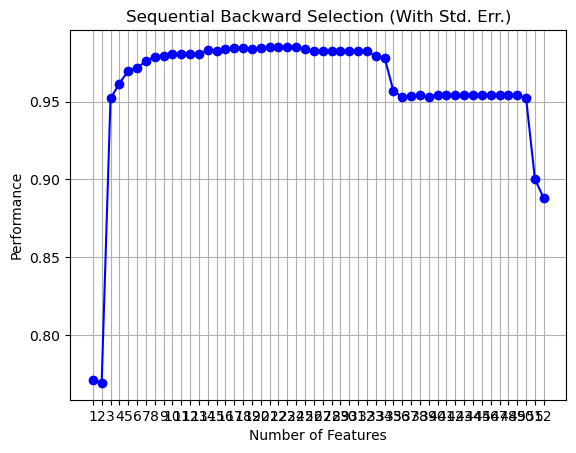

In [43]:
fig = plot_sfs(sbs.get_metric_dict(), kind='std_err')
print("Selected Features :", sbs.k_feature_names_)
print("Selected Features ID :", sbs.k_feature_idx_)
plt.title('Sequential Backward Selection (With Std. Err.)')
plt.grid()
plt.show()